## Goal: Reduce the Credit Loss by using EDA techniques to find driving factors behind loan default.

### Risk associated with the problem

> 1. If the applicant is likely to repay the loan, then not approving loan is a loss of business (rejecting loans for non - default).
> 2. If the applicant is not likely to repay the loan, then approving loan may lead to financial loss (approving loans for default).


### Methodology applied: 
> 1. Start Data sourcing
> 2. Perform Data cleaning
> 3. Univariate analysis
> 4. Bivariate analysis


In [4]:
import pandas as pd #dataframe
import numpy as np #numerical python
#importing Libraries for data visualization
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #plotting
import plotly.express as px #plotting
# Warnings library will be used to ignore some warnings
import warnings #warning
warnings.filterwarnings('ignore')

In [5]:
loan_history = pd.read_csv('loan.csv')
load_dic=pd.read_excel('Data_Dictionary.xlsx')
loan_history.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


# Step 1: Data Sourcing. 

## Load the given dataset from CSV, excel and check foe basic information 

In [7]:
load_dic.head()

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...


In [8]:
# Number of rows and columns
print("Number of rows:", loan_history.shape[0])
print("Number of columns:", loan_history.shape[1])

# Number of null values in each column
print("Number of null values per column:")
print(loan_history.isnull().sum())


Number of rows: 39717
Number of columns: 111
Number of null values per column:
id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64


In [10]:
# Total number of null values in the entire DataFrame
print("Total number of null values:", loan_history.isnull().sum().sum())


Total number of null values: 2263366


In [15]:
# Number of duplicate rows
print("Number of duplicate rows:", loan_history.duplicated().sum())

Number of duplicate rows: 0


In [17]:
print(loan_history.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB
None


In [19]:
print(loan_history.describe())

                 id     member_id     loan_amnt   funded_amnt  \
count  3.971700e+04  3.971700e+04  39717.000000  39717.000000   
mean   6.831319e+05  8.504636e+05  11219.443815  10947.713196   
std    2.106941e+05  2.656783e+05   7456.670694   7187.238670   
min    5.473400e+04  7.069900e+04    500.000000    500.000000   
25%    5.162210e+05  6.667800e+05   5500.000000   5400.000000   
50%    6.656650e+05  8.508120e+05  10000.000000   9600.000000   
75%    8.377550e+05  1.047339e+06  15000.000000  15000.000000   
max    1.077501e+06  1.314167e+06  35000.000000  35000.000000   

       funded_amnt_inv   installment    annual_inc           dti  \
count     39717.000000  39717.000000  3.971700e+04  39717.000000   
mean      10397.448868    324.561922  6.896893e+04     13.315130   
std        7128.450439    208.874874  6.379377e+04      6.678594   
min           0.000000     15.690000  4.000000e+03      0.000000   
25%        5000.000000    167.020000  4.040400e+04      8.170000   
50%   

In [21]:
# Calculate the percentage of missing values in each column
null_percentage = loan_history.isnull().mean() * 100

# Filter columns with more than a 50% of missing values
threshold = 50  # Adjust this threshold as needed
columns_with_nulls = null_percentage[null_percentage > threshold]

print(f"Columns with more than 50% missing values:")
print(columns_with_nulls)


Columns with more than 50% missing values:
mths_since_last_delinq             64.662487
mths_since_last_record             92.985372
next_pymnt_d                       97.129693
mths_since_last_major_derog       100.000000
annual_inc_joint                  100.000000
dti_joint                         100.000000
verification_status_joint         100.000000
tot_coll_amt                      100.000000
tot_cur_bal                       100.000000
open_acc_6m                       100.000000
open_il_6m                        100.000000
open_il_12m                       100.000000
open_il_24m                       100.000000
mths_since_rcnt_il                100.000000
total_bal_il                      100.000000
il_util                           100.000000
open_rv_12m                       100.000000
open_rv_24m                       100.000000
max_bal_bc                        100.000000
all_util                          100.000000
total_rev_hi_lim                  100.000000
inq_fi      

In [23]:
# Calculate the percentage of missing values in each column
null_percentage = loan_history.isnull().mean() * 100

# Identify columns with 50% or more null values
columns_to_drop = null_percentage[null_percentage >= 50].index

# Drop those columns
loan_history_cleaned = loan_history.drop(columns=columns_to_drop)

# Print the shape of the DataFrame after removing columns
print("Shape of the DataFrame after removing columns with 50% or more null values:")
print(loan_history_cleaned.shape)

Shape of the DataFrame after removing columns with 50% or more null values:
(39717, 54)


In [25]:
print(loan_history_cleaned.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')


In [27]:
loan_history_cleaned.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


# Step 2: Data Cleaning
### 2.1 Remove irrilavent columns 
> 1. like member id/id as it is duplicate
> 2. like desc,emp_title,desc, zipcode as it has no significance in analysis
> 3. columns which contain 1 unique value
> 4. like customer behaviour variables for eg delinq_2yrs,earliest_cr_line, inq_last_6mths,open_acc etc

In [30]:
loan_history_cleaned=loan_history_cleaned.drop(['delinq_2yrs','earliest_cr_line','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','application_type'],axis=1)
loan_history_cleaned=loan_history_cleaned.drop(['title','emp_title','desc','url'],axis=1)
loan_history_cleaned=loan_history_cleaned.drop(['zip_code'],axis=1)
loan_history_cleaned=loan_history_cleaned.drop(['member_id'],axis=1)
loan_history_cleaned = loan_history_cleaned.loc[:,loan_history_cleaned.nunique()>1]

In [32]:
print(loan_history_cleaned.shape)

(39717, 19)


In [34]:
# as funded_amnt_inv as it is already in line with funded_amnt remove that column and Removing loans with status as 'Current'
loan_history_cleaned = loan_history_cleaned[loan_history_cleaned.loan_status!='Current']
loan_history_cleaned=loan_history_cleaned.drop(['funded_amnt_inv'],axis=1)

In [36]:
print(loan_history_cleaned.shape)

(38577, 18)


### 2.2 Handle Null values by either subsituting or removing the rows

In [39]:
print(loan_history_cleaned.isnull().sum().sort_values(ascending=False))

emp_length              1033
pub_rec_bankruptcies     697
annual_inc                 0
dti                        0
addr_state                 0
purpose                    0
loan_status                0
issue_d                    0
verification_status        0
id                         0
loan_amnt                  0
sub_grade                  0
grade                      0
installment                0
int_rate                   0
term                       0
funded_amnt                0
home_ownership             0
dtype: int64


In [41]:
print(loan_history_cleaned.emp_length.value_counts())
print(loan_history_cleaned.pub_rec_bankruptcies.value_counts())

emp_length
10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: count, dtype: int64
pub_rec_bankruptcies
0.0    36238
1.0     1637
2.0        5
Name: count, dtype: int64


In [43]:
# we can substitute zero as null values for pub_rec_bankruptcies and drop null values for emp_length
loan_history_cleaned = loan_history_cleaned.dropna(subset=['emp_length'])
loan_history_cleaned.pub_rec_bankruptcies.fillna(0,inplace=True)
print(loan_history_cleaned.shape)

(37544, 18)


In [45]:
print(loan_history_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 37544 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    37544 non-null  int64  
 1   loan_amnt             37544 non-null  int64  
 2   funded_amnt           37544 non-null  int64  
 3   term                  37544 non-null  object 
 4   int_rate              37544 non-null  object 
 5   installment           37544 non-null  float64
 6   grade                 37544 non-null  object 
 7   sub_grade             37544 non-null  object 
 8   emp_length            37544 non-null  object 
 9   home_ownership        37544 non-null  object 
 10  annual_inc            37544 non-null  float64
 11  verification_status   37544 non-null  object 
 12  issue_d               37544 non-null  object 
 13  loan_status           37544 non-null  object 
 14  purpose               37544 non-null  object 
 15  addr_state            37

### 2.3 Correcting Data Types and create drived columns

In [48]:
loan_history_cleaned.term=loan_history_cleaned.term.apply(lambda x: int(x.replace(' months',''))).astype(int)
loan_history_cleaned.int_rate=loan_history_cleaned.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
loan_history_cleaned.grade=loan_history_cleaned.grade.astype('category')
loan_history_cleaned.sub_grade=loan_history_cleaned.sub_grade.astype('category')
loan_history_cleaned.emp_length=loan_history_cleaned.emp_length.apply(lambda x: x.replace('years','').replace('+','').replace('< 1','0.5').replace('year','')).astype(float)
loan_history_cleaned.home_ownership=loan_history_cleaned.home_ownership.astype('category')
loan_history_cleaned.verification_status=loan_history_cleaned.verification_status.astype('category')
loan_history_cleaned.issue_d=pd.to_datetime(loan_history_cleaned.issue_d,format='%b-%y')
loan_history_cleaned['issue_year']=pd.to_datetime(loan_history_cleaned.issue_d,format='%b-%y').dt.year
loan_history_cleaned['issue_month']=pd.to_datetime(loan_history_cleaned.issue_d,format='%b-%y').dt.month
loan_history_cleaned.purpose=loan_history_cleaned.purpose.astype('category')
loan_history_cleaned.addr_state=loan_history_cleaned.addr_state.astype('category')

In [50]:
print(loan_history_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 37544 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    37544 non-null  int64         
 1   loan_amnt             37544 non-null  int64         
 2   funded_amnt           37544 non-null  int64         
 3   term                  37544 non-null  int64         
 4   int_rate              37544 non-null  float64       
 5   installment           37544 non-null  float64       
 6   grade                 37544 non-null  category      
 7   sub_grade             37544 non-null  category      
 8   emp_length            37544 non-null  float64       
 9   home_ownership        37544 non-null  category      
 10  annual_inc            37544 non-null  float64       
 11  verification_status   37544 non-null  category      
 12  issue_d               37544 non-null  datetime64[ns]
 13  loan_status          

In [52]:
# Shape of the dataframe after removing columns
print(loan_history_cleaned.shape)

(37544, 20)


In [54]:
#funded_amnt, installment

In [56]:
loan_history_cleaned.head(30)

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies,issue_year,issue_month
0,1077501,5000,5000,36,10.65,162.87,B,B2,10.0,RENT,24000.00,Verified,2011-12-01,Fully Paid,credit_card,AZ,27.65,0.0,2011,12
1,1077430,2500,2500,60,15.27,59.83,C,C4,0.5,RENT,30000.00,Source Verified,2011-12-01,Charged Off,car,GA,1.00,0.0,2011,12
2,1077175,2400,2400,36,15.96,84.33,C,C5,10.0,RENT,12252.00,Not Verified,2011-12-01,Fully Paid,small_business,IL,8.72,0.0,2011,12
3,1076863,10000,10000,36,13.49,339.31,C,C1,10.0,RENT,49200.00,Source Verified,2011-12-01,Fully Paid,other,CA,20.00,0.0,2011,12
5,1075269,5000,5000,36,7.90,156.46,A,A4,3.0,RENT,36000.00,Source Verified,2011-12-01,Fully Paid,wedding,AZ,11.20,0.0,2011,12
6,1069639,7000,7000,60,15.96,170.08,C,C5,8.0,RENT,47004.00,Not Verified,2011-12-01,Fully Paid,debt_consolidation,NC,23.51,0.0,2011,12
7,1072053,3000,3000,36,18.64,109.43,E,E1,9.0,RENT,48000.00,Source Verified,2011-12-01,Fully Paid,car,CA,5.35,0.0,2011,12
8,1071795,5600,5600,60,21.28,152.39,F,F2,4.0,OWN,40000.00,Source Verified,2011-12-01,Charged Off,small_business,CA,5.55,0.0,2011,12
9,1071570,5375,5375,60,12.69,121.45,B,B5,0.5,RENT,15000.00,Verified,2011-12-01,Charged Off,other,TX,18.08,0.0,2011,12
10,1070078,6500,6500,60,14.65,153.45,C,C3,5.0,OWN,72000.00,Not Verified,2011-12-01,Fully Paid,debt_consolidation,AZ,16.12,0.0,2011,12


In [58]:
# Looks like loan_amnt & funded_amnt are same. Lets compare the two columns and create a boolean mask
matching_rows = loan_history_cleaned['funded_amnt'] == loan_history_cleaned['loan_amnt']

# Count how many rows have the same value in both columns
matching_count = matching_rows.sum()

# Calculate the percentage of matching rows
matching_percentage = (matching_count / len(loan_history_cleaned)) * 100

# Print the result
print(f"Percentage of rows where 'funded_amnt' and 'loan_amt' are the same: {matching_percentage:.2f}%")


Percentage of rows where 'funded_amnt' and 'loan_amt' are the same: 95.40%


In [60]:
# As both loan_amnt & funded_amnt are same in most case (>95%) we shall drop funded_amnt column and also Installment as it is irrelevant 
loan_history_cleaned=loan_history_cleaned.drop(['funded_amnt'],axis=1)
loan_history_cleaned=loan_history_cleaned.drop(['installment'],axis=1)

In [62]:
print(loan_history_cleaned.columns)

Index(['id', 'loan_amnt', 'term', 'int_rate', 'grade', 'sub_grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'purpose', 'addr_state', 'dti',
       'pub_rec_bankruptcies', 'issue_year', 'issue_month'],
      dtype='object')


In [64]:
# no need of issue_d as we already have derived columns issue_year & issue_month
loan_history_cleaned=loan_history_cleaned.drop(['issue_d'],axis=1)

In [66]:
print(loan_history_cleaned.shape)

(37544, 17)


### 2.4 Remove Outliers

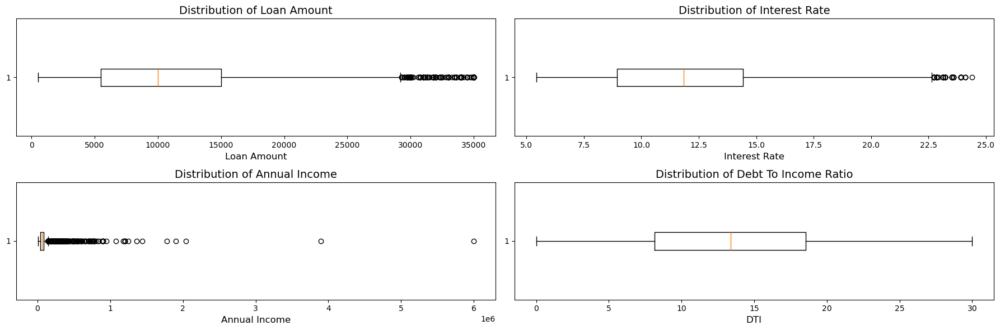

In [69]:

# Create a figure with 1 row and 3 columns for the box plots
plt.figure(figsize=(18, 6))

# Box plot for loan_amnt
plt.subplot(2, 2, 1)  # (rows, columns, plot number)
plt.boxplot(loan_history_cleaned['loan_amnt'], vert=False)
plt.title('Distribution of Loan Amount', fontsize=14)
plt.xlabel('Loan Amount', fontsize=12)

# Box plot for int_rate
plt.subplot(2, 2, 2)  # (rows, columns, plot number)
plt.boxplot(loan_history_cleaned['int_rate'], vert=False)
plt.title('Distribution of Interest Rate', fontsize=14)
plt.xlabel('Interest Rate', fontsize=12)

# Box plot for annual_inc
plt.subplot(2, 2, 3)  # (rows, columns, plot number)
plt.boxplot(loan_history_cleaned['annual_inc'], vert=False)
plt.title('Distribution of Annual Income', fontsize=14)
plt.xlabel('Annual Income', fontsize=12)

# Box plot for dti
plt.subplot(2, 2, 4)  # (rows, columns, plot number)
plt.boxplot(loan_history_cleaned['dti'], vert=False)
plt.title('Distribution of Debt To Income Ratio', fontsize=14)
plt.xlabel('DTI', fontsize=12)

# Adjust layout for better spacing between the plots
plt.tight_layout()

# Show the plot
plt.show()


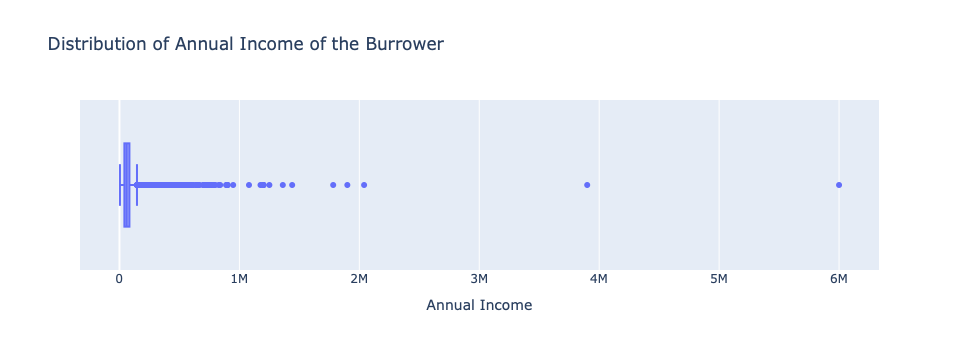

In [71]:
px.box(loan_history_cleaned,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Burrower',labels={'annual_inc':'Annual Income'}).show()


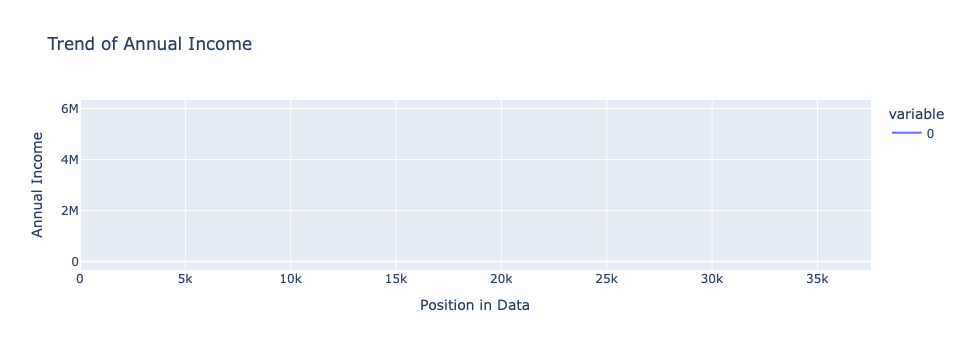

In [73]:
# Distribution of Annual Income has starnge around 99th percentile. Lets confirm using line graph

px.line(sorted(loan_history_cleaned.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()


In [75]:
#annual_inc is increasing in expontntial format around 99th percentile. we can remove values greater than 99th percentile and replot the line graph

loan_history_cleaned = loan_history_cleaned[loan_history_cleaned.annual_inc<=np.percentile(loan_history_cleaned.annual_inc,99)]


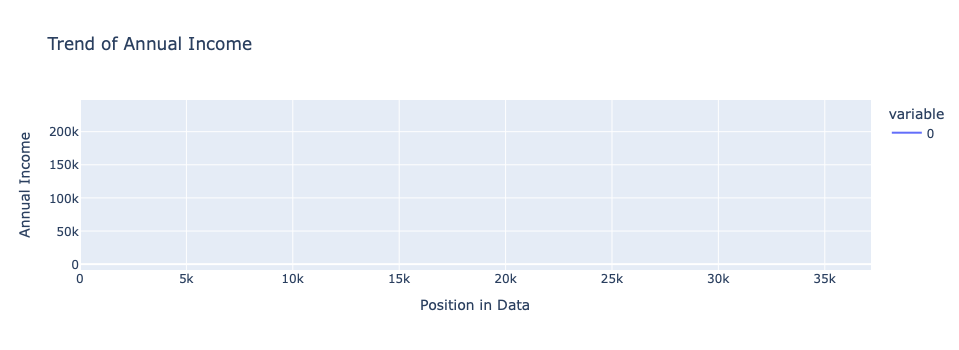

In [77]:
px.line(sorted(loan_history_cleaned.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()


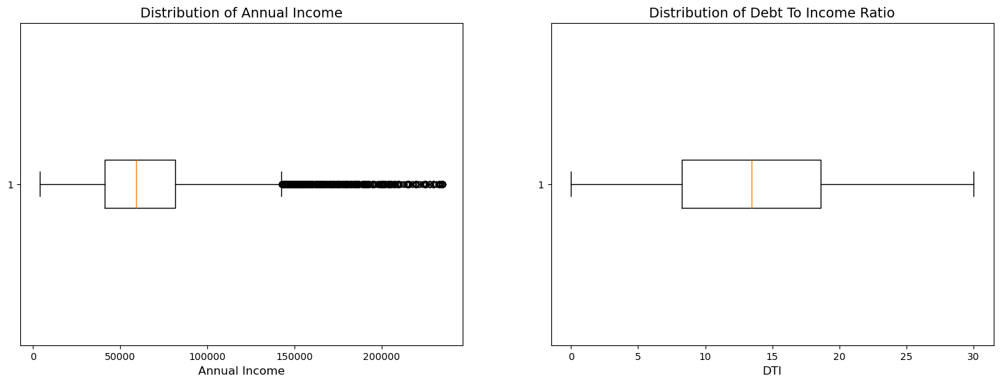

In [79]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.boxplot(loan_history_cleaned['annual_inc'], vert=False)
plt.title('Distribution of Annual Income', fontsize=14)
plt.xlabel('Annual Income', fontsize=12)

plt.subplot(1, 2, 2)
plt.boxplot(loan_history_cleaned['dti'], vert=False)
plt.title('Distribution of Debt To Income Ratio', fontsize=14)
plt.xlabel('DTI', fontsize=12)
plt.show()

##### -------------- This completes Data Cleaning ------------------

# Step 3: Data Analysis

## 3.1: Univariate Analysis on Numerical variables

### Number of loans defaulted

loan_status
Fully Paid     31813
Charged Off     5360
Name: count, dtype: int64


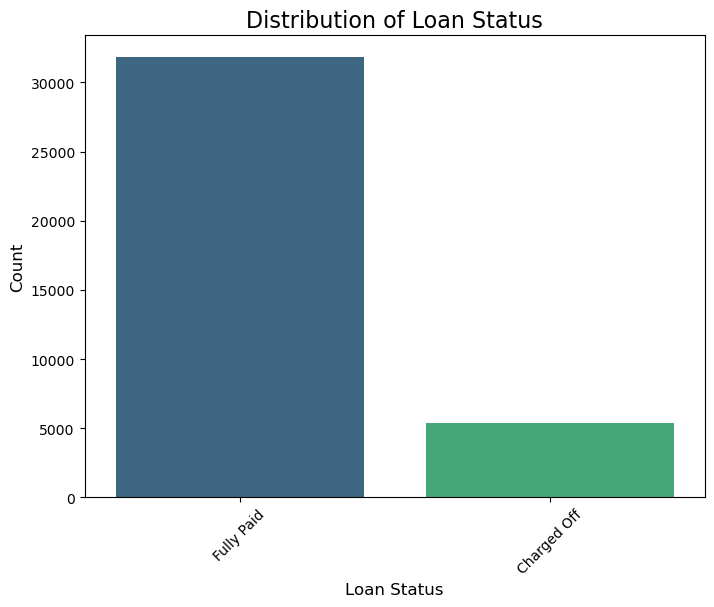

In [85]:
loan_status_counts = loan_history_cleaned['loan_status'].value_counts()

# Display the result
print(loan_status_counts)

# Set up the plot
plt.figure(figsize=(8, 6))

# Create a bar plot
sns.barplot(x=loan_status_counts.index, y=loan_status_counts.values, palette='viridis')

# Adding title and labels
plt.title('Distribution of Loan Status', fontsize=16)
plt.xlabel('Loan Status', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

## Analyse the influencial parameter for charged off loans

### Influcence of numerical parameters on charged off loans

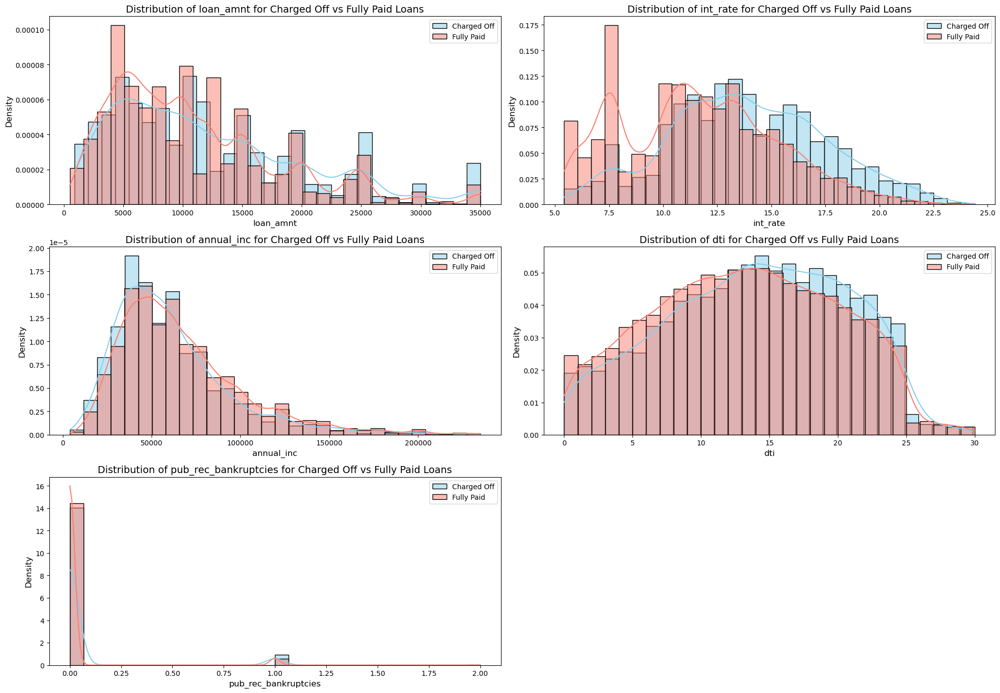

In [89]:
charged_off_data = loan_history_cleaned[loan_history_cleaned['loan_status'] == 'Charged Off']
fully_paid_data = loan_history_cleaned[loan_history_cleaned['loan_status'] == 'Fully Paid']

# List of numerical columns to analyze
numerical_columns = ['loan_amnt', 'int_rate', 'annual_inc', 'dti', 'pub_rec_bankruptcies']

# Set up the matplotlib figure with a larger size
plt.figure(figsize=(20, 18))  # Increased figure size (20x18 inches)

# Iterate through each numerical column and create relevant plots side by side
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 2, i)  # Create a subplot grid (4 rows, 2 columns)
    
    # Plot a histogram and KDE plot for 'Charged Off' loans
    sns.histplot(charged_off_data[column], kde=True, bins=30, color='skyblue', label='Charged Off', stat='density', edgecolor='black')
    
    # Plot a histogram and KDE plot for 'Fully Paid' loans
    sns.histplot(fully_paid_data[column], kde=True, bins=30, color='salmon', label='Fully Paid', stat='density', edgecolor='black')
    
    # Set the title for each plot
    plt.title(f'Distribution of {column} for Charged Off vs Fully Paid Loans', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend()

# Adjust the layout for better readability
plt.tight_layout()
plt.show()

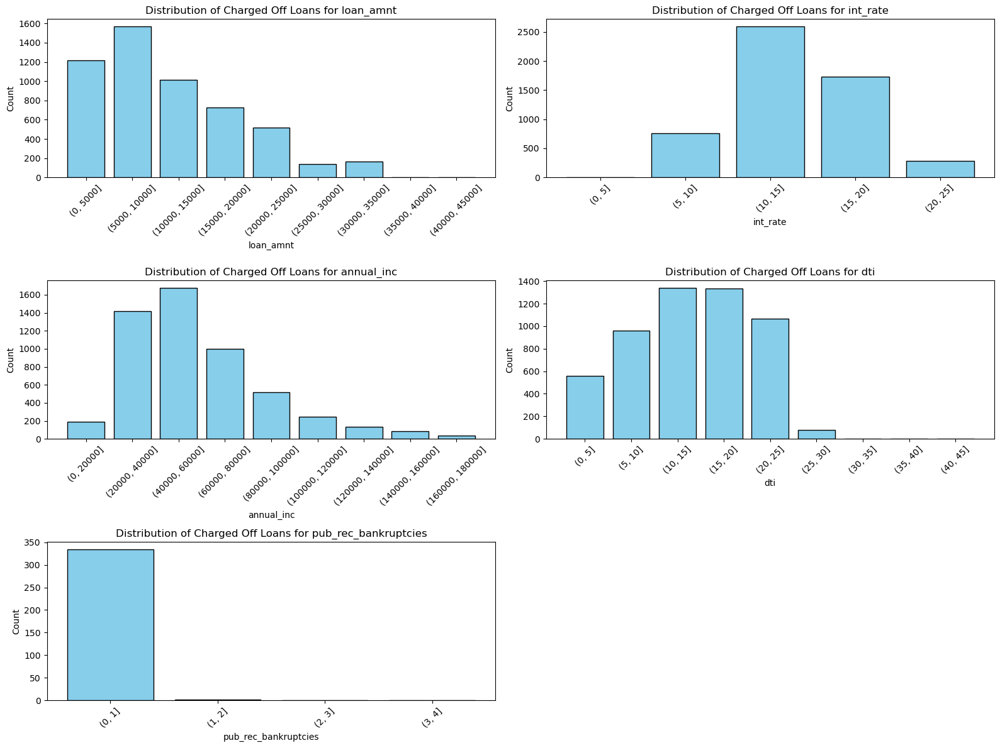

In [90]:
charged_off_data = loan_history_cleaned[loan_history_cleaned['loan_status'] == 'Charged Off']

# Define numerical columns and their bin ranges
columns_bins = {
    'loan_amnt': np.arange(0, 50000, 5000),          # Loan amounts in $5000 intervals
    'int_rate': np.arange(0, 30, 5),                # Interest rates in 5% intervals
    'annual_inc': np.arange(0, 200000, 20000),      # Annual income in $20,000 intervals
    'dti': np.arange(0, 50, 5),                     # DTI in intervals of 5
    'pub_rec_bankruptcies': np.arange(0, 5, 1)      # Public bankruptcies as is
}

# Set up subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(16, 12))  # 3 rows, 2 columns
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Create bar plots for each numerical column
for i, (column, bins) in enumerate(columns_bins.items()):
    # Bin the data
    charged_off_data[f'{column}_bins'] = pd.cut(charged_off_data[column], bins=bins)
    plot_data = charged_off_data[f'{column}_bins'].value_counts().sort_index()
    
    # Plot the data
    axes[i].bar(plot_data.index.astype(str), plot_data.values, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Distribution of Charged Off Loans for {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=45)

# Hide unused subplots
for j in range(len(columns_bins), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



#### Inference:
#### 1. DTI ratio of 10-20 has majority of defaulters
#### 2. Majority of the defaulters have taken loan under 20000 to 60000
#### 3. Majority of the defaulters attribute to interest rate b/w 10-20%

## 3.2: Univariate Analysis on Categorical variables

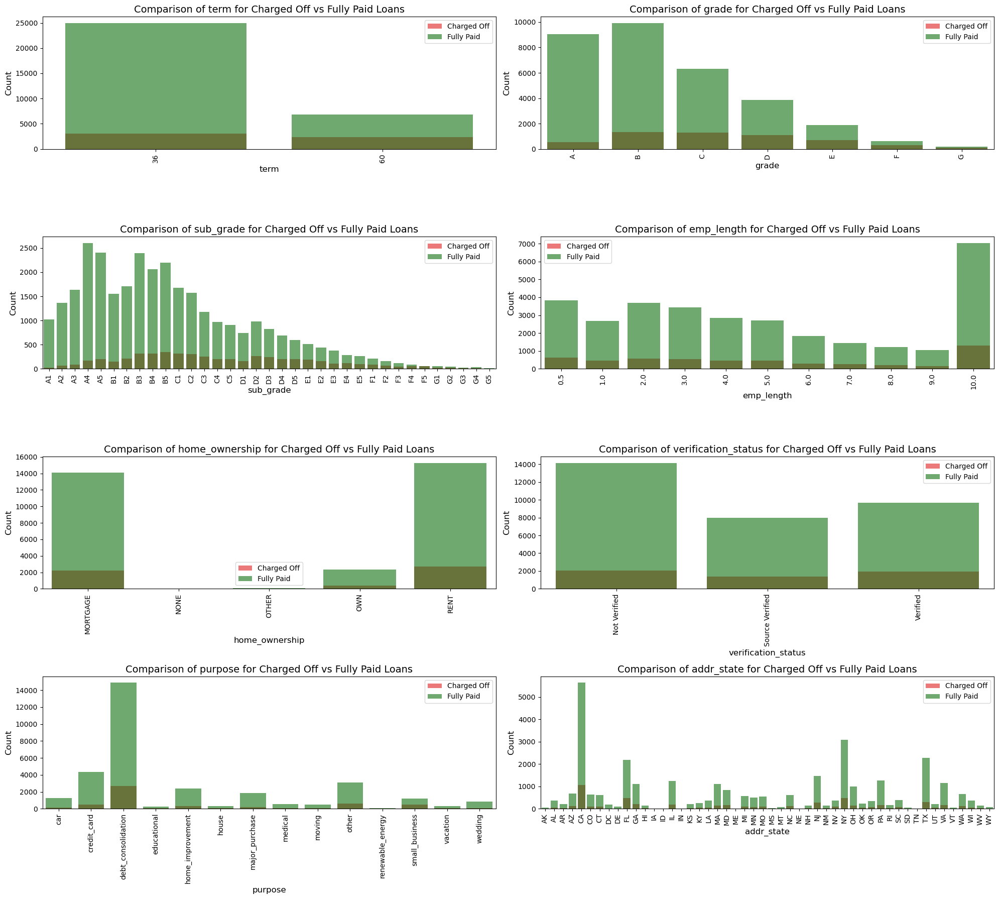

In [95]:
categorical_columns = ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 
                       'verification_status', 'purpose', 'addr_state']

# Set up the matplotlib figure with a larger size
plt.figure(figsize=(20, 18))

# Iterate through each categorical column and create relevant plots side by side
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(4, 2, i)  # Create a subplot grid (4 rows, 4 columns)
    
    # Plot for 'Charged Off' loans
    sns.countplot(x=column, data=charged_off_data, color='red', label='Charged Off', alpha=0.6)
    
    # Plot for 'Fully Paid' loans on the same axis
    sns.countplot(x=column, data=fully_paid_data, color='green', label='Fully Paid', alpha=0.6)
    
    # Set the title for each plot
    plt.title(f'Comparison of {column} for Charged Off vs Fully Paid Loans', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.tick_params(axis='x', rotation=90, labelsize=10) 
    plt.legend()

# Adjust the layout for better readability
plt.tight_layout()
plt.show()

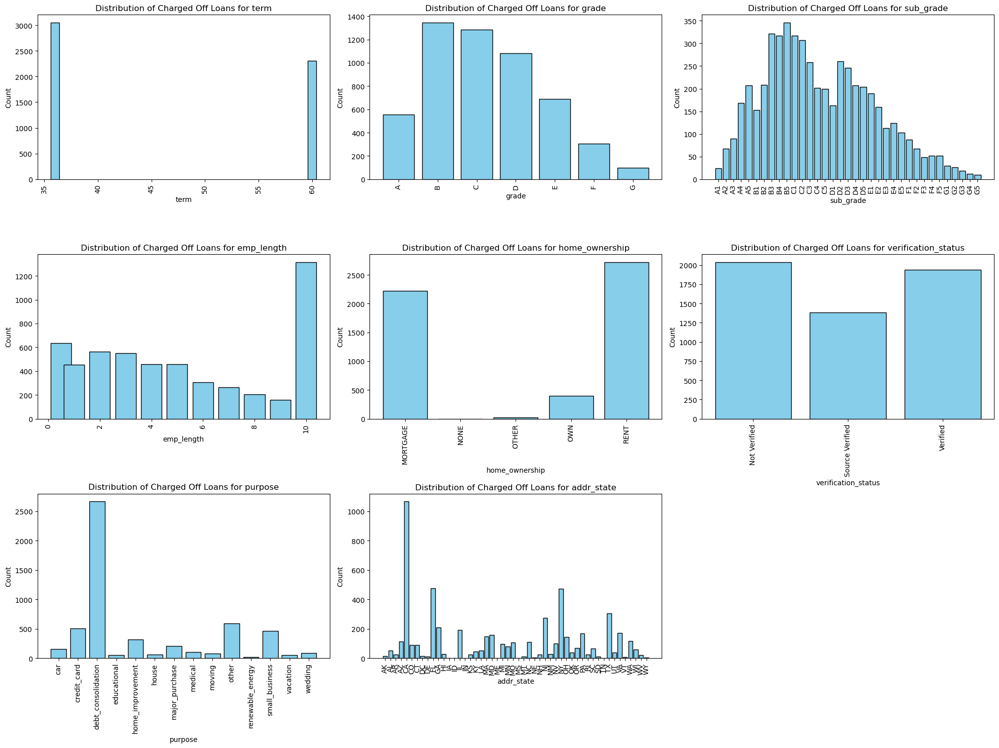

In [96]:
# Define categorical columns
categorical_columns = [
    'term', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
    'verification_status', 'purpose', 'addr_state'
]

# Set up subplots
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns + 2) // 3, ncols=3, figsize=(20, 15))
axes = axes.flatten()

# Create bar plots for each categorical column
for i, column in enumerate(categorical_columns):
    plot_data = charged_off_data[column].value_counts().sort_index()
    
    axes[i].bar(plot_data.index, plot_data.values, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Distribution of Charged Off Loans for {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90, labelsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### Inference:
#### 1. B & C grade category has majority of defaulters
#### 2. Majority of the defaulters have taken loan for debt_consolidation
#### 3. Majority of the defaulters live in Rented or Mortagage house

## 4: Bivariate Analysis

### Since it is clear from step 3 that grade, purpose, home_ownership, DTI has major influence. Lets analyse the correlation with each other 


#### 4.1: What is the pupose of loan for Grade B & C category 

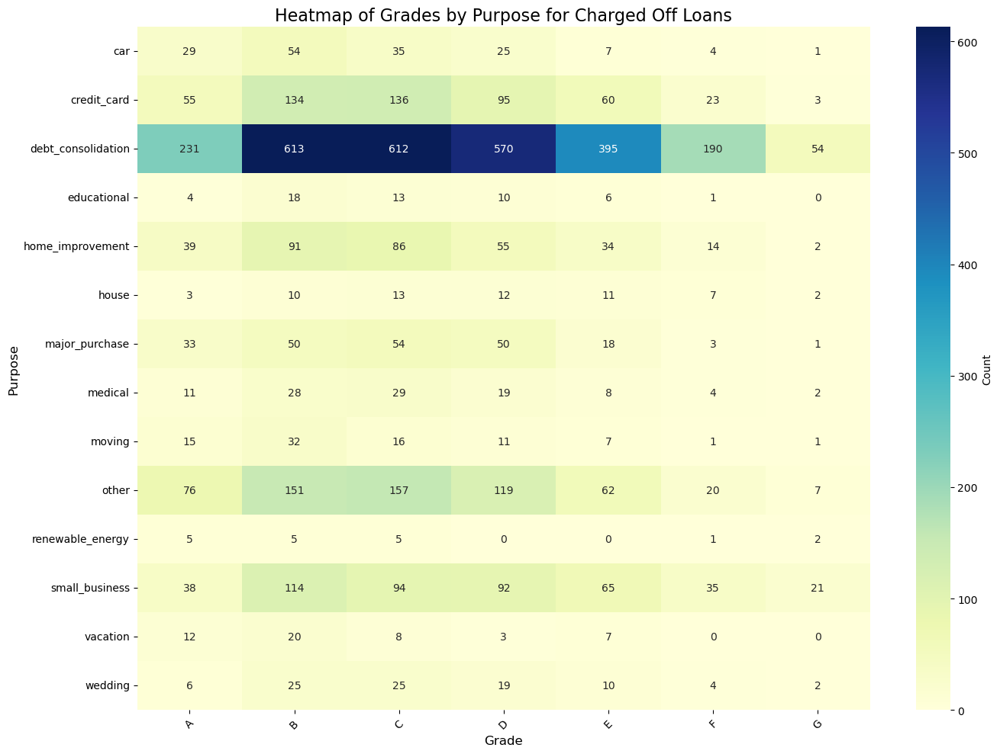

In [103]:
# Create a pivot table for heatmap
heatmap_data = charged_off_data.pivot_table(index='purpose', columns='grade', aggfunc='size', fill_value=0)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu', cbar_kws={'label': 'Count'})
plt.title('Heatmap of Grades by Purpose for Charged Off Loans', fontsize=16)
plt.xlabel('Grade', fontsize=12)
plt.ylabel('Purpose', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

### Inference: Grade B & C category people mainly take loan to consolidate their existing debts

#### 4.2: What is the housing situation for Grade B & C category 

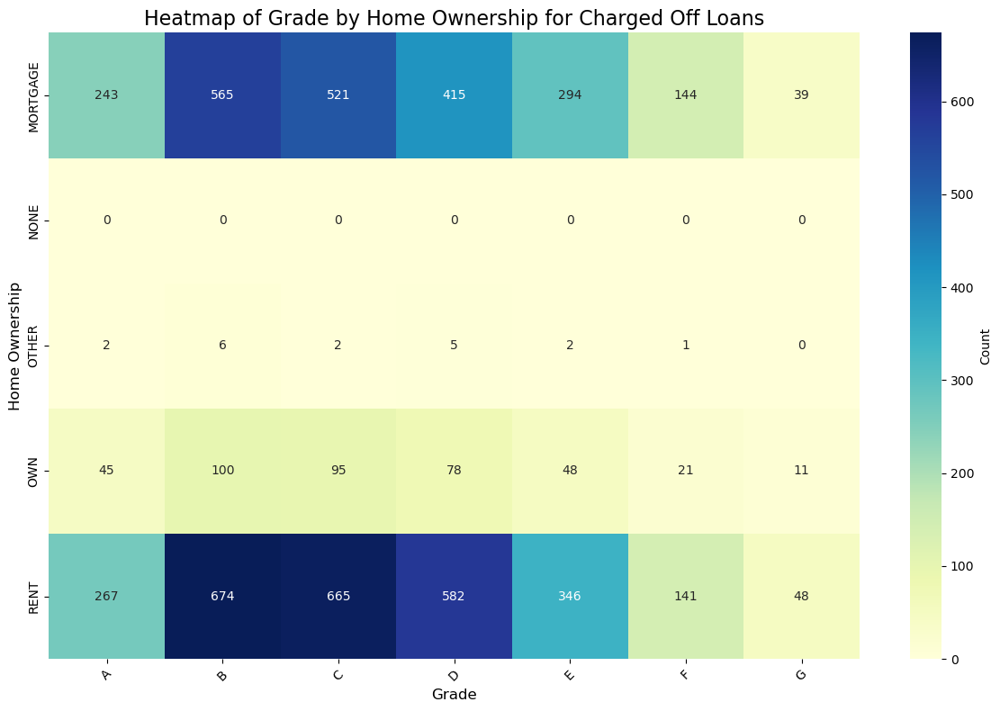

In [111]:
heatmap_data = charged_off_data.pivot_table(index='home_ownership', columns='grade', aggfunc='size', fill_value=0)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu', cbar_kws={'label': 'Count'})
plt.title('Heatmap of Grade by Home Ownership for Charged Off Loans', fontsize=16)
plt.xlabel('Grade', fontsize=12)
plt.ylabel('Home Ownership', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

### Inference: Grade B & C category people mainly live in Rented or mortgage home.

#### 4.3: What is the housing situation for people who request loan for debt consolidation

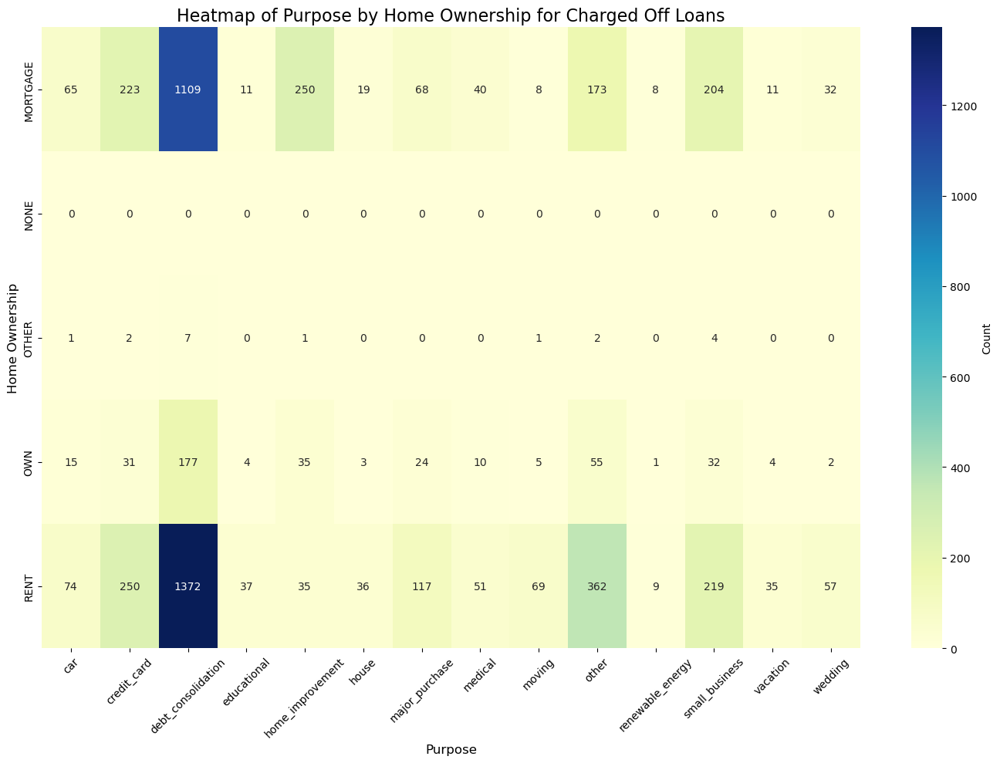

In [115]:
heatmap_data = charged_off_data.pivot_table(index='home_ownership', columns='purpose', aggfunc='size', fill_value=0)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu', cbar_kws={'label': 'Count'})
plt.title('Heatmap of Purpose by Home Ownership for Charged Off Loans', fontsize=16)
plt.xlabel('Purpose', fontsize=12)
plt.ylabel('Home Ownership', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

### Inference: People who request for loan for debt_consilation mainly live Rented or mortgage home.

#### 4.4: What is the DTI for people who request loan for debt consolidation

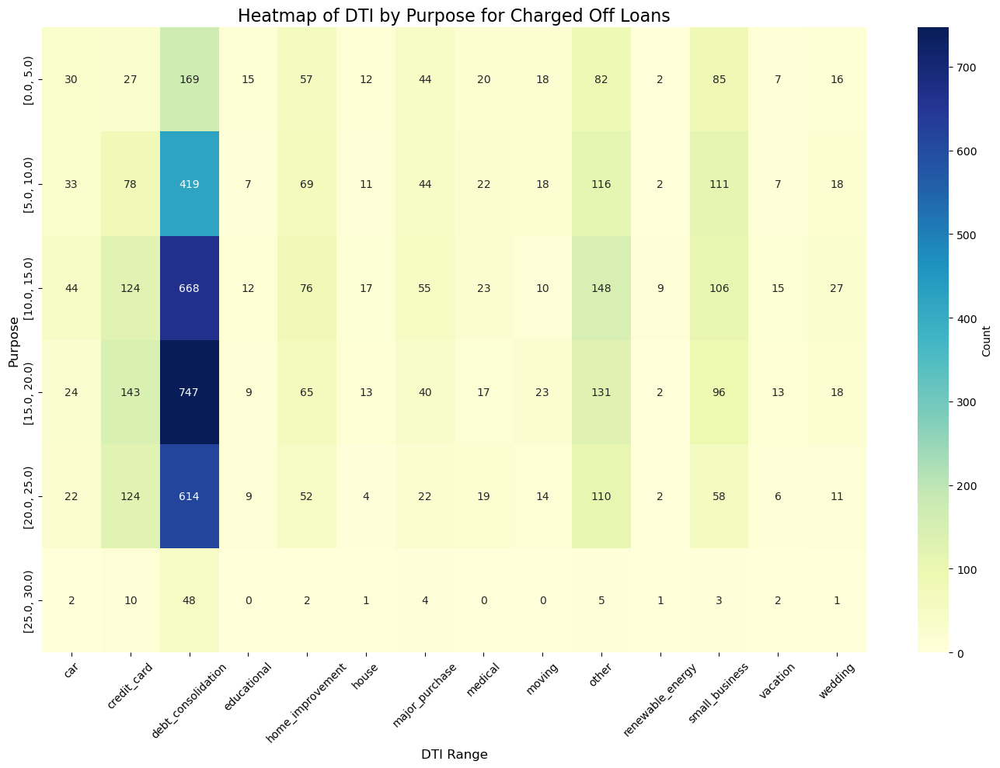

In [119]:
bins = np.arange(0, charged_off_data['dti'].max() + 5, 5)  # Bin width of 5
charged_off_data['dti_bin'] = pd.cut(charged_off_data['dti'], bins, right=False)

# Create a pivot table for the heatmap
heatmap_data = charged_off_data.pivot_table(index='dti_bin', columns='purpose', aggfunc='size', fill_value=0)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu', cbar_kws={'label': 'Count'})
plt.title('Heatmap of DTI by Purpose for Charged Off Loans', fontsize=16)
plt.xlabel('DTI Range', fontsize=12)
plt.ylabel('Purpose', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

### Inference: People who request loan for debt_consolidation already have higher DTI in the range of 10-20

#### 4.6: What is the DTI for people who has annual income around 500000

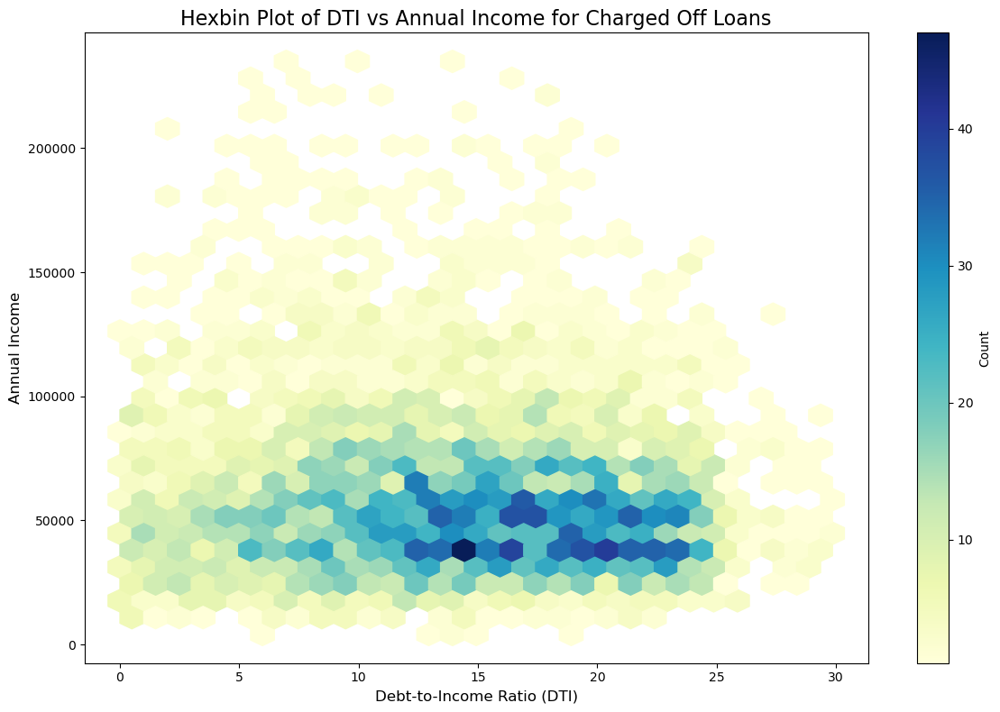

In [123]:
plt.figure(figsize=(12, 8))
plt.hexbin(
    x=charged_off_data['dti'], 
    y=charged_off_data['annual_inc'], 
    gridsize=30, 
    cmap='YlGnBu', 
    mincnt=1
)
cb = plt.colorbar(label='Count')
plt.title('Hexbin Plot of DTI vs Annual Income for Charged Off Loans', fontsize=16)
plt.xlabel('Debt-to-Income Ratio (DTI)', fontsize=12)
plt.ylabel('Annual Income', fontsize=12)
plt.tight_layout()
plt.show()

#### 4.6: What is the annual income of people in Grade B & C

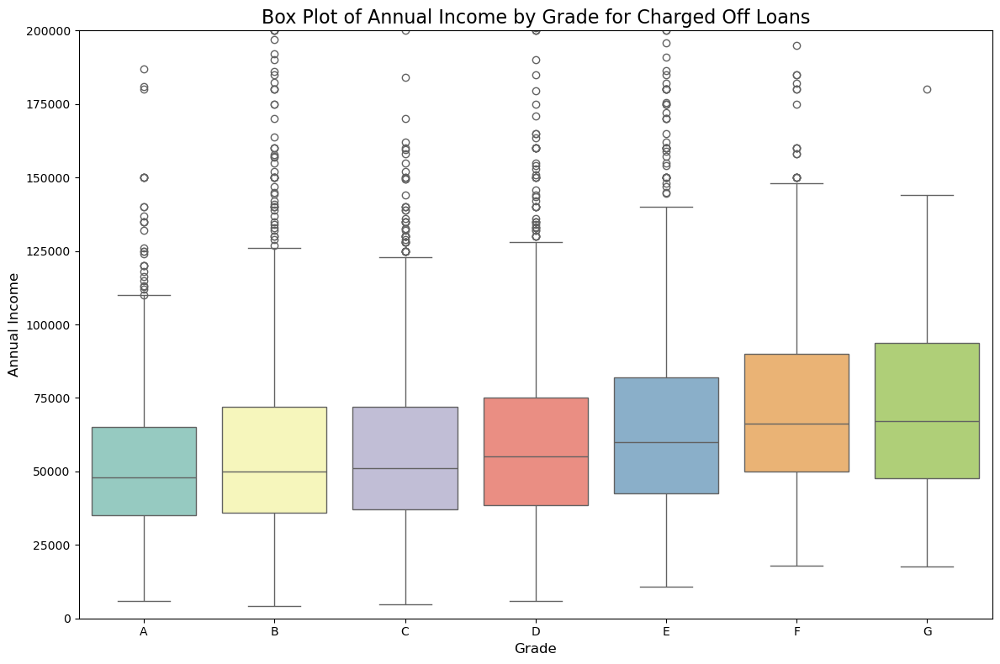

In [126]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=charged_off_data, x='grade', y='annual_inc', palette='Set3')
plt.title('Box Plot of Annual Income by Grade for Charged Off Loans', fontsize=16)
plt.xlabel('Grade', fontsize=12)
plt.ylabel('Annual Income', fontsize=12)
plt.ylim(0, 200000)  # Adjusted to focus on typical income ranges
plt.tight_layout()
plt.show()


# Conclusion

## Univariate Analysis

> 1. The number of defaulted loan is very less than (14% of borrowers) the number of fully paid loan
> 2. The majority of loan has a term of 36 months compared to 60 months.
> 3. Majority of the people who applied loan have very large debt compared to the income registerd, concentrated in the 10-15 DTI ratio
> 4. The interest rate is more crowded around 5-10 and 10-15 with a drop near 10.
> 5. A large amount of loans deafulted are with grade 'B' and 'C' commpared to rest.
> 6. Majority of the people who applied loan have working experience greater than 10 years.
> 7. Majority of the people who applied loan are on mortage or rent.
> 8. Approx 50% of the borrowers are verified by the company or have source verified.
> 9. large percentage of loans are taken for debt consolidation followed by credit card.
> 10. Majority of the people who applied loan have no record of Public Recorded Bankruptcy.

## Bivariate Analysis

> 1. Among all the borrowers, poeple with Annual income < 50000 are being dafaulted following a specific pattern where they fall under lower middle class category
> 2. Among all the borrowers, poeple with Annual income < 50000 show DTI ratio 10 to 25, indicates debt obligations
> 3. Defaulted Borrowers with Annual income < 50000 falls under Grade B & C
> 4. Defaulted Borrowers with Annual income < 50000 live in rented or mortgage house which adds to more debt
> 5. Above analysis translates to show that majority of defaulters chose to opt loan to fulfill debt obligation 

## Major Driving factor which can be used to predict the chance of defaulting and avoiding Credit Loss:

> 1. DTI
> 2. Borrowers having annual income in the less than 50000
> 3. Borrowers with grades like b,c which indicates high risk.
> 4. Borrowers with very high Debt to Income value.
> 5. Verification Status
> 6. Purpose with additional care if it is for debt consolidation for people with income < 50000 

